In [1]:
import os
fname = 'data/MRI/' 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn.functional as F
import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *

from skimage.io import imsave

from utils.transform_mri import*

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor


imsize =-1
PLOT=True

In [3]:
import scipy.io as scio
pathh='data/mask/mask1d0.25.mat'
mask=scio.loadmat(pathh)
mask=mask['k']
mask=torch.tensor(mask).type(dtype)
mask=mask.unsqueeze(0).unsqueeze(0).unsqueeze(-1)
mask=torch.cat((mask,mask),-1)
mask.shape

torch.Size([1, 1, 192, 160, 2])

(160, 192)
(1, 192, 160)


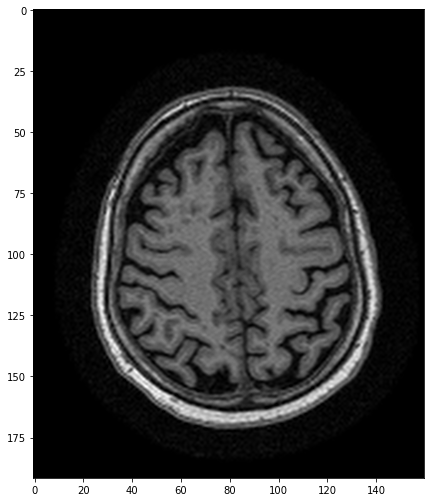

In [4]:
img_pil = crop_image(get_image(fname+'321.png', imsize)[0], d=32)
print(img_pil.size)
img_np=pil_to_np(img_pil)
img_np = img_np
print(img_np.shape)
img_var=torch.tensor(img_np).type(dtype)
img_var=img_var.unsqueeze(0)
plot_image_grid([img_np], 4, 6);

In [5]:
ssize=img_var.unsqueeze(-1).shape
ZZ=torch.zeros(ssize).type(dtype)
def forwardm(img_var):
    img_var=img_var.unsqueeze(-1)
    img_var_complex=torch.cat((img_var,ZZ),-1)
    img_var_complex=fft2(img_var_complex)
    return img_var_complex
img_var=img_var.unsqueeze(-1)
img_var_complex=torch.cat((img_var,ZZ),-1)
ssize=img_var_complex.size()
measure_noise = torch.cuda.FloatTensor(ssize)
torch.randn(ssize, out=measure_noise)
img_var_complex=img_var_complex+0.1*measure_noise
img_var_complex=fft2(img_var_complex)
measurement=img_var_complex*mask
print(mask.shape)


torch.Size([1, 1, 192, 160, 2])


tensor(10944.)
tensor([[1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.]])
(1, 192, 160)


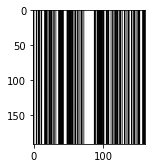

array([[[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]],

       [[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]],

       [[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]]], dtype=float32)

In [6]:
#noise injection depend on mm.sum()
#mm.sum(): number of nonzero entries of mask
mm=mask[0,0,:,:,0].cpu()
print(mm.sum())
on=torch.ones(mm.shape)
print(on-mm)
aaa =mm.unsqueeze(0).numpy()
print(aaa.shape)
plot_image_grid([aaa])

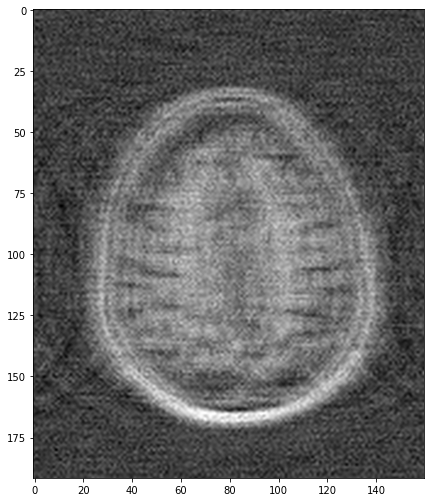

21.19942379266086


/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  


In [7]:
mse = torch.nn.MSELoss().type(dtype)
AA=ifft2(measurement)
A=AA[0,:,:,:,0].cpu()
A=A.numpy()
plot_image_grid([A], 4, 6);
print(compare_psnr(np.clip(A,0,1),img_np))


In [8]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./20
LR = 0.002
show_every = 100
exp_weight=0.99

num_iter = 10000
input_depth = 16
figsize = 2


net=get_net(input_depth,'skip', pad,
                  skip_n33d=64, 
                  skip_n33u=64, 
                  skip_n11=4, 
                  num_scales=5,
                  n_channels=1,
                  upsample_mode='bilinear').type(dtype)  
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
# Compute number of parameter
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 563045


In [9]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0
i = 0
psnr_total=[]
psnr_total2=[]
loss_total=[]
beta_total=[]
burn_in=1000
psrn_gt_sm=0
loss_data=1
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input,img_torch,psrn_gt_sm,loss_data
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    out_down=torch.nn.functional.interpolate(out, scale_factor=0.5, mode='bilinear')
    if i>burn_in:
        if out_avg is None:
            out_avg=out.detach()
        else:
            out_avg = out_avg * (i-burn_in-1)/(i-burn_in) + out.detach() * 1/(i-burn_in)

    total_loss = mse(mask*forwardm(out),measurement)
    loss_data=mse(mask*forwardm(out),measurement).item()
    total_loss.backward()
    psrn_gt = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm=psrn_gt
    if i>burn_in:
        psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    print ('Iteration %05d   loss_data %f  total_Loss %f  PSRN_gt: %f PSNR_gt_sm: %f' % (i, loss_data, total_loss.item(), psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0 and i>burn_in:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(torch_to_np(out), 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)    
    psnr_total.append(psrn_gt_sm)
    psnr_total2.append(psrn_gt)            
    i += 1

    return total_loss



In [10]:
def add_noise(model,level):
    for n in [x for x in model.parameters() if len(x.size()) == 4]:
        noise = torch.randn(n.size())*1*LR*level
        noise = noise.type(dtype)
        n.data = n.data + noise

/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/torch/nn/functional.py:3000: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and uses scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.p

time per 1000:  67.62619400024414791  total_Loss 0.003791  PSRN_gt: 24.398241 PSNR_gt_sm: 24.398241 


/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:47: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


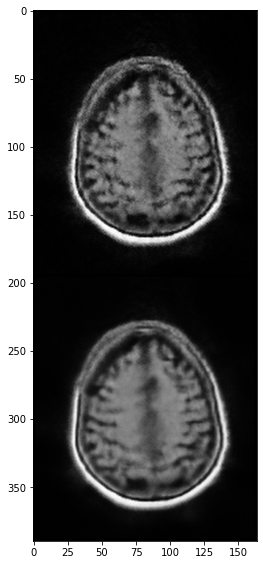

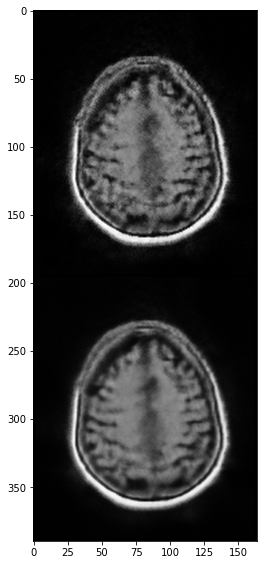

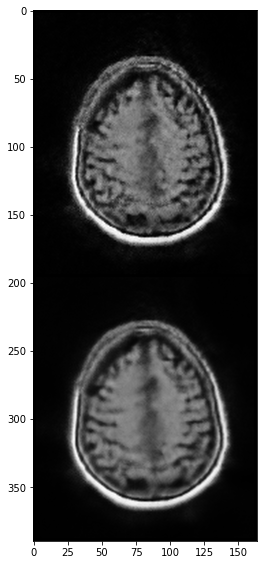

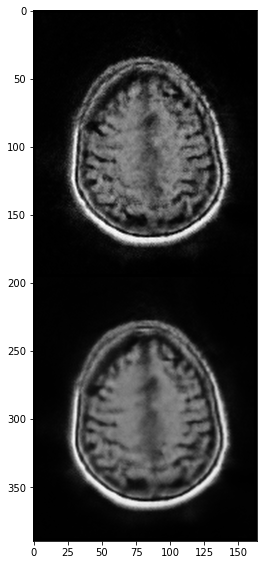

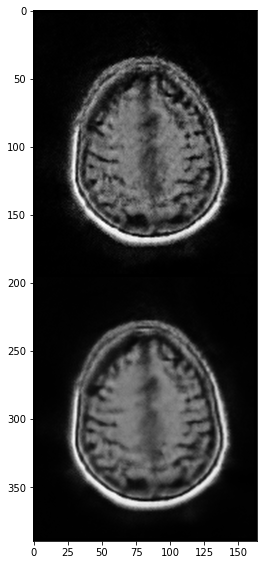

...

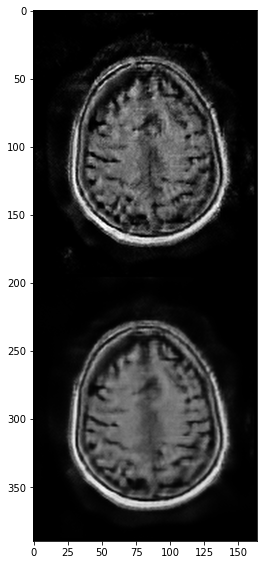

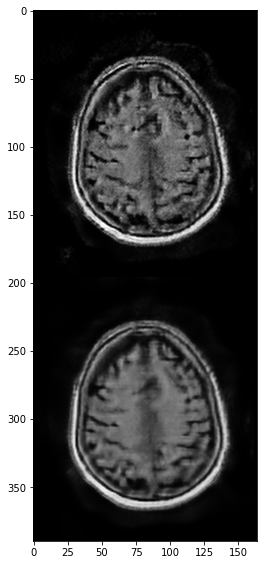

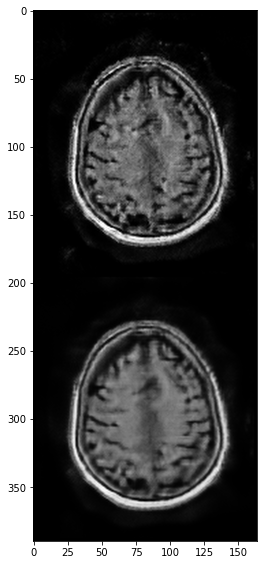

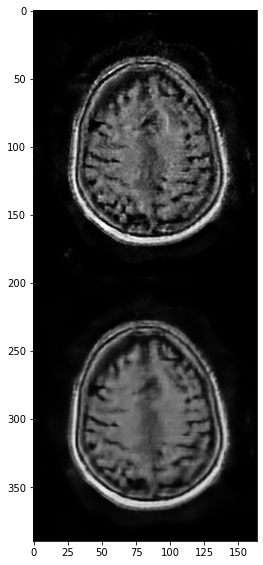

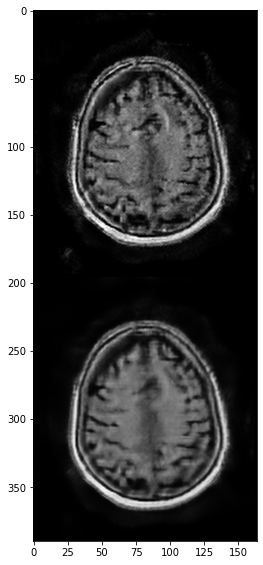

In [11]:
measure_error=1*(10944/(160*192))*(0.1)**2
import math
import time
optimizer = torch.optim.Adam([{'params':net.parameters()}], lr=LR,weight_decay=1e-7)
start = time.time()
for _ in range(num_iter):
    nlevel=math.exp(30*((measure_error/loss_data)-1))
    optimizer.zero_grad()
    closure()
    optimizer.step()
    add_noise(net,nlevel)
    if _ == 999:
        print('time per 1000: ', time.time()-start)